In [1]:
# Imports for Model Creation
import torch
from torch.nn import functional as F
from torch.nn import (
	Module, Conv2d, ReLU, PReLU, Dropout2d, AvgPool2d,
	Upsample, MaxPool2d, Sequential, MaxUnpool2d,
	BatchNorm2d, AdaptiveAvgPool2d, ConvTranspose2d
)

In [2]:
class Mish(Module):

	def __init(self):
		super().__init__()
	
	def forward(self, input):
		return input * torch.tanh(F.softplus(input))

In [3]:
class Activation(Module):
	
	def __init__(self, name='relu'):
		super().__init__()
		self.name = name
		if name == 'relu':
			self.act = ReLU()
		elif name == 'prelu':
			self.act = PReLU()
		elif name == 'mish':
			self.act = Mish()

	def forward(self, input):
		return self.act(input)

In [4]:
class InitialBlock(Module):
	
	def __init__(self, in_channels, out_channels, bias=False, activation='relu'):
		super().__init__()
		self.main_branch = Conv2d(
			in_channels, out_channels - 3,
			kernel_size=3, stride=2,
			padding=1, bias=bias
		)
		self.secondary_branch = MaxPool2d(3, stride=2, padding=1)
		self.batch_norm = BatchNorm2d(out_channels)
		self.activation = Activation(activation)

	def forward(self, x):
		main = self.main_branch(x)
		secondary = self.secondary_branch(x)
		output = torch.cat((main, secondary), 1)
		output = self.batch_norm(output)
		output = self.activation(output)
		return output

In [5]:
class RegularBottleneckBlock(Module):

	def __init__(
		self, channels, internal_ratio=4, kernel_size=3, padding=0,
		dilation=1, asymmetric=False, dropout_prob=0, bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = channels // internal_ratio
		
		### Main Branch ###
		
		# Block 1 Conv 1x1
		self.main_conv_block_1 = Sequential(
			Conv2d(
				channels, internal_channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2
		if asymmetric:
			self.main_conv_block_2 = Sequential(
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=(kernel_size, 1), stride=1,
					padding=(padding, 0), dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=(1, kernel_size), stride=1,
					padding=(0, padding), dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
			)
		else:
			self.main_conv_block_2 = Sequential(
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=kernel_size, stride=1,
					padding=padding, dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
			)
		
		# Block 3 Conv 1x1
		self.main_conv_block_3 = Sequential(
			Conv2d(
				internal_channels, channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(channels),
			Activation(activation),
		)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	
	def forward(self, x):
		secondary_branch = x
		main_branch = self.main_conv_block_1(x)
		main_branch = self.main_conv_block_2(main_branch)
		main_branch = self.main_conv_block_3(main_branch)
		main_branch = self.dropout(main_branch)
		output = main_branch + secondary_branch
		output = self.activation(output)
		return output

In [6]:
class DownsampleBottleneckBlock(Module):

	def __init__(
		self, in_channels, out_channels, internal_ratio=4,
		return_indices=False, dropout_prob=0, bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = in_channels // internal_ratio
		self.return_indices = return_indices

		### Main Branch ###

		# Block 1 Conv 1x1
		self.main_conv_block_1 = Sequential(
			Conv2d(
				in_channels, internal_channels,
				kernel_size=2, stride=2, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Conv 3x3
		self.main_conv_block_2 = Sequential(
			Conv2d(
				internal_channels, internal_channels,
				kernel_size=3, stride=1, padding=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Conv 1x1
		self.main_conv_block_3 = Sequential(
			Conv2d(
				internal_channels, out_channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(out_channels),
			Activation(activation)
		)

		### Secondary Branch ###
		self.secondary_maxpool = MaxPool2d(
			2, stride=2,
			return_indices=return_indices
		)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	

	def forward(self, x):
		# Main Branch
		main_branch = self.main_conv_block_1(x)
		main_branch = self.main_conv_block_2(main_branch)
		main_branch = self.main_conv_block_3(main_branch)
		# Secondary Branch
		if self.return_indices:
			secondary_branch, max_indices = self.secondary_maxpool(x)
		else:
			secondary_branch = self.secondary_maxpool(x)
		# Padding
		n, ch_main, h, w = main_branch.size()
		ch_sec = secondary_branch.size()[1]
		padding = torch.zeros(n, ch_main - ch_sec, h, w)
		if secondary_branch.is_cuda:
			padding = padding.cuda()
		# Concatenate
		secondary_branch = torch.cat((secondary_branch, padding), 1)
		output = secondary_branch + main_branch
		output = self.activation(output)
		if self.return_indices:
			return output, max_indices
		else:
			return output

In [7]:
class UpsampleBottleneckBlock(Module):

	def __init__(
		self, in_channels, out_channels,
		internal_ratio=4, dropout_prob=0,
		bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = in_channels // internal_ratio

		### Main Branch ###

		# Block 1 Conv 1x1
		self.main_branch_conv_1 = Sequential(
			Conv2d(
				in_channels, internal_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Transposed Convolution
		self.main_branch_transpose_conv_2 = ConvTranspose2d(
			internal_channels, internal_channels,
			kernel_size=2, stride=2, bias=bias
		)
		self.main_branch_bn_2 = BatchNorm2d(internal_channels)
		self.main_branch_act_2 = Activation(activation)

		# Block 3 Conv 1x1
		self.main_branch_conv_3 = Sequential(
			Conv2d(
				internal_channels, out_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(out_channels),
			Activation(activation)
		)

		### Secondary Branch ###
		self.secondary_conv = Sequential(
			Conv2d(
				in_channels, out_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(out_channels)
		)
		self.secondary_unpool = MaxUnpool2d(kernel_size=2)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	

	def forward(self, x, max_indices, output_size):
		# Main Branch
		main_branch = self.main_branch_conv_1(x)
		main_branch = self.main_branch_transpose_conv_2(main_branch, output_size=output_size)
		main_branch = self.main_branch_bn_2(main_branch)
		main_branch = self.main_branch_act_2(main_branch)
		main_branch = self.main_branch_conv_3(main_branch)
		main_branch = self.dropout(main_branch)
		# Secondary Branch
		secondary_branch = self.secondary_conv(x)
		secondary_branch = self.secondary_unpool(
			secondary_branch, max_indices,
			output_size=output_size
		)
		# Concatenate
		output = main_branch + secondary_branch
		output = self.activation(output)
		return output

In [8]:
class Enet(Module):

	def __init__(self, num_classes, encoder_activation='mish', decoder_activation='relu'):
		
		super().__init__()
		
		# Initial Block
		self.initial_block = InitialBlock(3, 16, activation=encoder_activation)
		
		### Encoding Stages ###

		# Stage 1
		self.down_bottleneck_1 = DownsampleBottleneckBlock(
			16, 64, return_indices=True,
			dropout_prob=0.01, activation=encoder_activation
		)
		self.bottleneck_1_1 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_2 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_3 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_4 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)

		# Stage 2
		self.down_bottleneck_2 = DownsampleBottleneckBlock(
			64, 128, return_indices=True,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_1 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_2 = RegularBottleneckBlock(
			128, dilation=2,
			padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_3 = RegularBottleneckBlock(
			128, kernel_size=5, padding=2,
            asymmetric=True, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_4 = RegularBottleneckBlock(
			128, dilation=4, padding=4,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_5 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_6 = RegularBottleneckBlock(
			128, dilation=8, padding=8,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_7 = RegularBottleneckBlock(
			128, kernel_size=5, asymmetric=True,
            padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_8 = RegularBottleneckBlock(
			128, dilation=16, padding=16,
			dropout_prob=0.1, activation=encoder_activation
		)

		# Stage 3
		self.regular_bottleneck_3 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_1 = RegularBottleneckBlock(
			128, dilation=2, padding=2,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_2 = RegularBottleneckBlock(
			128, kernel_size=5, padding=2,
            asymmetric=True, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_3 = RegularBottleneckBlock(
			128, dilation=4, padding=4,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_4 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_5 = RegularBottleneckBlock(
			128, dilation=8, padding=8,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_6 = RegularBottleneckBlock(
			128, kernel_size=5, asymmetric=True,
            padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_7 = RegularBottleneckBlock(
			128, dilation=16, padding=16,
			dropout_prob=0.1, activation=encoder_activation
		)

		# Stage 4
		self.upsample_4 = UpsampleBottleneckBlock(
			128, 64, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_4_1 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_4_2 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)

		# Stage 5
		self.upsample_5 = UpsampleBottleneckBlock(
			64, 16, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_5 = RegularBottleneckBlock(
			16, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.transposed_conv = ConvTranspose2d(
			16, num_classes, kernel_size=3,
            stride=2, padding=1, output_padding=1, bias=False
		)

	def forward(self, x):
		# Initial Block
		input_size = x.size()
		x = self.initial_block(x)
		# Stage 1
		input_size_1 = x.size()
		x, max_indices_1 = self.down_bottleneck_1(x)
		x = self.bottleneck_1_1(x)
		x = self.bottleneck_1_2(x)
		x = self.bottleneck_1_3(x)
		x = self.bottleneck_1_4(x)
		# Stage 2
		input_size_2 = x.size()
		x, max_indices_2 = self.down_bottleneck_2(x)
		x = self.bottleneck_2_1(x)
		x = self.bottleneck_2_2(x)
		x = self.bottleneck_2_3(x)
		x = self.bottleneck_2_4(x)
		x = self.bottleneck_2_5(x)
		x = self.bottleneck_2_6(x)
		x = self.bottleneck_2_7(x)
		x = self.bottleneck_2_8(x)
		# Stage 3
		x = self.regular_bottleneck_3(x)
		x = self.bottleneck_3_1(x)
		x = self.bottleneck_3_2(x)
		x = self.bottleneck_3_3(x)
		x = self.bottleneck_3_4(x)
		x = self.bottleneck_3_5(x)
		x = self.bottleneck_3_6(x)
		x = self.bottleneck_3_7(x)
		# Stage 4
		x = self.upsample_4(x, max_indices_2, output_size=input_size_2)
		x = self.bottleneck_4_1(x)
		x = self.bottleneck_4_2(x)
		# Stage 5
		x = self.upsample_5(x, max_indices_1, output_size=input_size_1)
		x = self.bottleneck_5(x)
		x = self.transposed_conv(x)
		return x

In [9]:
print('GPU:', torch.cuda.get_device_name(0))
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
enet = Enet(12, encoder_activation='prelu', decoder_activation='mish')
enet = enet.to(device)

GPU: Quadro P5000


In [10]:
!mkdir camvid
%cd camvid
!wget https://www.dropbox.com/s/ej1gx48bxqbtwd2/CamVid.zip?dl=0 -O CamVid.zip
!unzip -qq CamVid.zip
!rm CamVid.zip
%cd ..

/notebooks/camvid
--2020-01-09 17:20:27--  https://www.dropbox.com/s/ej1gx48bxqbtwd2/CamVid.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.2.1, 2620:100:6017:1::a27d:201
Connecting to www.dropbox.com (www.dropbox.com)|162.125.2.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/ej1gx48bxqbtwd2/CamVid.zip [following]
--2020-01-09 17:20:27--  https://www.dropbox.com/s/raw/ej1gx48bxqbtwd2/CamVid.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc0cb7f9fdba30ffb4ce57936a9a.dl.dropboxusercontent.com/cd/0/inline/Av3ZaupZhQmzNsMk3mf2NKG_uEUZxOjBZd631fVRmkyFEQhS4Ry-YvDlRlcmJGHQ24z3MO_lY4MW2C-GE7Ks6X9O8nA2E3m5bctnXVQaePoS7T8c82HwaWM-hH1blL4K0aw/file# [following]
--2020-01-09 17:20:28--  https://uc0cb7f9fdba30ffb4ce57936a9a.dl.dropboxusercontent.com/cd/0/inline/Av3ZaupZhQmzNsMk3mf2NKG_uEUZxOjBZd631fVRmkyFEQhS4Ry-YvDlRlcmJGHQ24z3MO_lY4MW2C-GE7Ks6X9O8nA2E3m5b

In [12]:
import numpy as np
import torch, os
from glob import glob
from time import time
from tqdm import tqdm
from PIL import Image
from torch.nn import functional as F
from matplotlib import pyplot as plt
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision.transforms import ToTensor, ToPILImage

In [13]:
class CamVidDataset(Dataset):

	def __init__(self, images, labels, height, width):
		self.images = images
		self.labels = labels
		self.height = height
		self.width = width
	
	def __len__(self):
		return len(self.images)
	
	def __getitem__(self, index):
		image_id = self.images[index]
		label_id = self.labels[index]
		# Read Image
		x = Image.open(image_id)
		x = [np.array(x)]
		x = np.stack(x, axis=2)
		x = torch.tensor(x).transpose(0, 2).transpose(1, 3) # Convert to N, C, H, W
		# Read Mask
		y = Image.open(label_id)
		y = [np.array(y)]
		y = torch.tensor(y)
		return x.squeeze(), y.squeeze()

In [14]:
train_images = sorted(glob('./camvid/train/*'))
train_labels = sorted(glob('./camvid/trainannot/*'))
val_images = sorted(glob('./camvid/val/*'))
val_labels = sorted(glob('./camvid/valannot/*'))
test_images = sorted(glob('./camvid/test/*'))
test_labels = sorted(glob('./camvid/testannot/*'))
batch_size = 10

In [15]:
train_dataset = CamVidDataset(train_images, train_labels, 512, 512)
val_dataset = CamVidDataset(val_images, val_labels, 512, 512)
test_dataset = CamVidDataset(test_images, test_labels, 512, 512)

In [16]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

In [17]:
def decode_segmap(image, color_dict):
    label_colours = np.array([
		color_dict['obj0'], color_dict['obj1'],
		color_dict['obj2'], color_dict['obj3'],
		color_dict['obj4'], color_dict['obj5'],
		color_dict['obj6'], color_dict['obj7'],
		color_dict['obj8'], color_dict['obj9'],
		color_dict['obj10'], color_dict['obj11']
	]).astype(np.uint8)
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)
    for l in range(0, 12):
        r[image == l] = label_colours[l, 0]
        g[image == l] = label_colours[l, 1]
        b[image == l] = label_colours[l, 2]
    rgb = np.zeros((image.shape[0], image.shape[1], 3)).astype(np.uint8)
    rgb[:, :, 0] = b
    rgb[:, :, 1] = g
    rgb[:, :, 2] = r
    return rgb

In [18]:
def predict_rgb(model, tensor, color_dict):
    with torch.no_grad():
        out = model(tensor.float()).squeeze(0)
    out = out.data.max(0)[1].cpu().numpy()
    return decode_segmap(out, color_dict)

In [19]:
color_dict = {
    'obj0' : [255, 0, 0], # Sky
    'obj1' : [0, 51, 204], # Building
    'obj2' : [0, 255, 255], # Posts
    'obj3' : [153, 102, 102], # Road
    'obj4' : [51, 0, 102], # Pavement
    'obj5' : [0, 255, 0], # Trees
    'obj6' : [102, 153, 153], # Signs
    'obj7' : [204, 0, 102], # Fence
    'obj8' : [102, 0, 0], # Car
    'obj9' : [0, 153, 102], # Pedestrian
    'obj10' : [255, 255, 255], # Cyclist
    'obj11' : [0, 0, 0] # bicycles
}

In [20]:
x_batch, y_batch = next(iter(train_loader))
x_batch.shape, y_batch.shape

(torch.Size([10, 3, 360, 480]), torch.Size([10, 360, 480]))

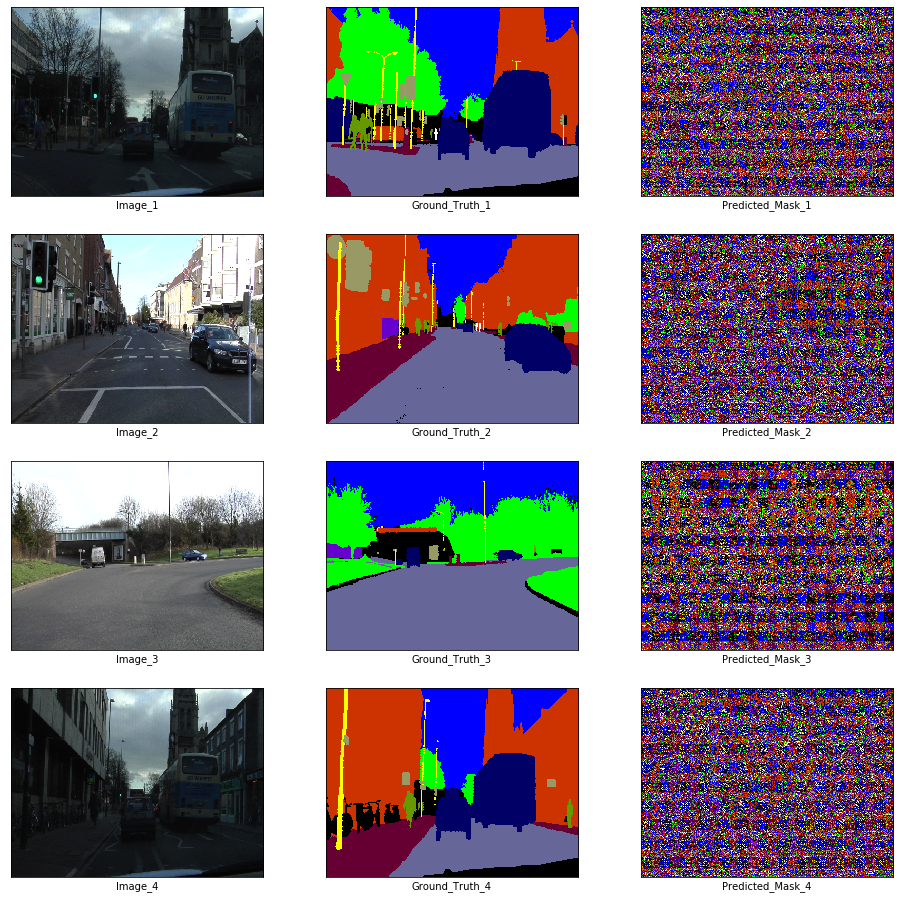

In [21]:
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

In [22]:
from torch.optim import Adam
from torch.nn import CrossEntropyLoss

In [23]:
def get_class_weights(loader, num_classes, c=1.02):
    _, y= next(iter(loader))
    y_flat = y.flatten()
    each_class = np.bincount(y_flat, minlength=num_classes)
    p_class = each_class / len(y_flat)
    return 1 / (np.log(c + p_class))

In [24]:
class_weights = get_class_weights(train_loader, 12)
criterion = CrossEntropyLoss(
    weight=torch.FloatTensor(class_weights).to(device)
)
optimizer = Adam(
    enet.parameters(),
    lr=5e-4,
    weight_decay=2e-4
)

In [25]:
def train(
	model, train_dataloader, val_dataloader,
	device, criterion, optimizer, train_step_size, val_step_size,
	visualize_every, save_every, save_location, save_prefix, epochs):
	# Make sure that the checkpoint location exists
	try:
		os.mkdir(save_location)
	except:
		pass
	train_loss_history, val_loss_history = [], []
	# Training
	for epoch in range(1, epochs + 1):
		print('Epoch {}\n'.format(epoch))
		# Training
		start = time()
		train_loss = 0
		model.train()
		# Step Loop
		for step in tqdm(range(train_step_size)):
			x_batch, y_batch = next(iter(train_dataloader))
			x_batch = x_batch.squeeze().to(device)
			y_batch = y_batch.squeeze().to(device)
			optimizer.zero_grad()
			out = model(x_batch.float())
			loss = criterion(out, y_batch.long())
			loss.backward()
			optimizer.step()
			train_loss += loss.item()
		train_loss_history.append(train_loss / train_step_size)
		print('\nTraining Loss: {}'.format(train_loss_history[-1]))
		print('Training Time: {} seconds'.format(time() - start))
		# Validation
		val_loss = 0
		model.eval()
		for step in tqdm(range(val_step_size)):
			x_val, y_val = next(iter(val_dataloader))
			x_val = x_val.squeeze().to(device)
			y_val = y_val.squeeze().to(device)
			out = model(x_val.float())
			out = out.data.max(1)[1]
			val_loss += (y_val.long() - out.long()).float().mean()
		val_loss_history.append(val_loss)
		print('\nValidation Loss: {}'.format(val_loss))
		# Visualization
		if epoch % visualize_every == 0:
			x_batch, y_batch = next(iter(train_loader))
			fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
			plt.setp(axes.flat, xticks = [], yticks = [])
			c = 1
			for i, ax in enumerate(axes.flat):
				if i % 3 == 0:
					ax.imshow(ToPILImage()(x_batch[c]))
					ax.set_xlabel('Image_' + str(c))
				elif i % 3 == 1:
					ax.imshow(decode_segmap(y_batch[c], color_dict))
					ax.set_xlabel('Ground_Truth_' + str(c))
				elif i % 3 == 2:
					ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
					ax.set_xlabel('Predicted_Mask_' + str(c))
					c += 1
			plt.show()
		# Checkpoints
		if epoch % save_every == 0:
			checkpoint = {
				'epoch' : epoch,
				'train_loss' : train_loss,
				'val_loss' : val_loss,
				'state_dict' : model.state_dict()
			}
			torch.save(
				checkpoint,
				'{}/{}-{}-{}-{}.pth'.format(
					save_location, save_prefix,
					epoch, train_loss, val_loss
				)
			)
			print('Checkpoint saved')
	print(
        '\nTraining Done.\nTraining Mean Loss: {:6f}\nValidation Mean Loss: {:6f}'.format(
            sum(train_loss_history) / epochs,
            sum(val_loss_history) / epochs
        )
    )
	return train_loss_history, val_loss_history

  0%|          | 0/36 [00:00<?, ?it/s]

Epoch 1



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 2.3662548197640314
Training Time: 34.0957236289978 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.033370494842529
Epoch 2



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 2.032248748673333
Training Time: 34.27252650260925 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -0.7188587784767151
Epoch 3



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.7714865141444736
Training Time: 35.047614336013794 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 4.729763984680176
Epoch 4



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.629888978269365
Training Time: 34.97136449813843 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 3.48044490814209
Epoch 5



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.5113641288545396
Training Time: 33.945863485336304 seconds


100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


Validation Loss: 6.096414566040039


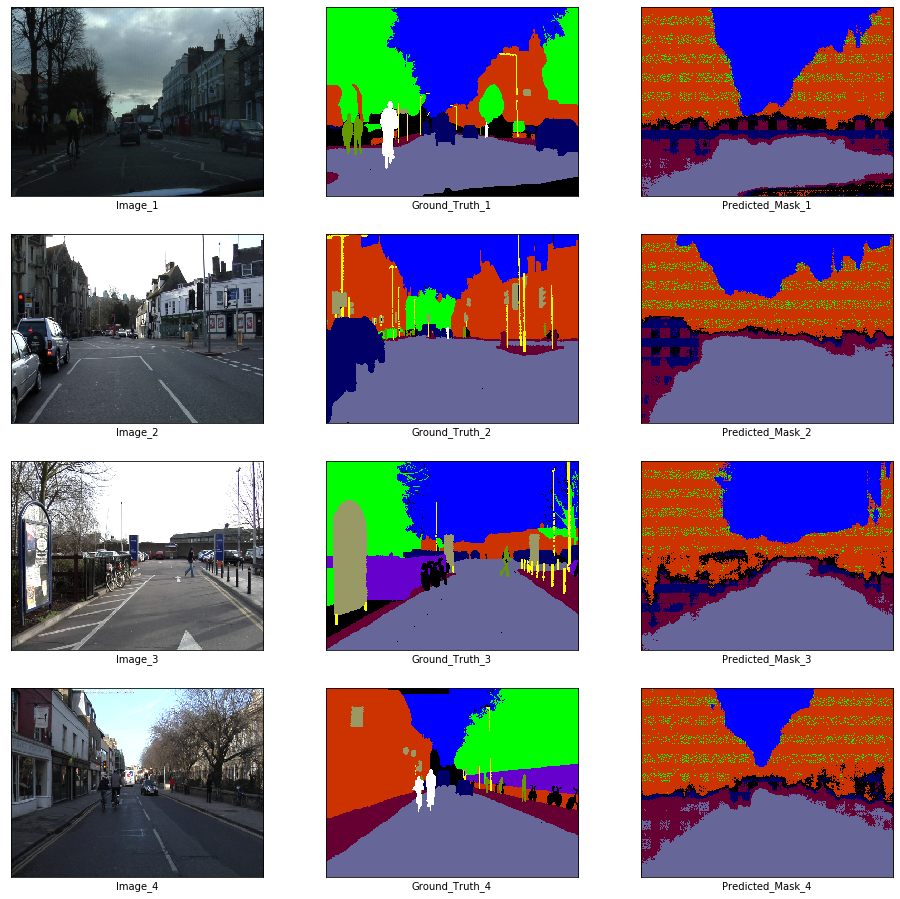

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 6



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.4386574162377253
Training Time: 34.41440200805664 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 0.6474860906600952
Epoch 7



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.350586301750607
Training Time: 35.859867811203 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 4.778741359710693
Epoch 8



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.2875308129522536
Training Time: 34.998841285705566 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 7.159191608428955
Epoch 9



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.253095679812961
Training Time: 34.560731649398804 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 0.11553065478801727
Epoch 10



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.2039500441816118
Training Time: 34.03646636009216 seconds


100%|██████████| 10/10 [00:07<00:00,  1.43it/s]


Validation Loss: 2.35198712348938


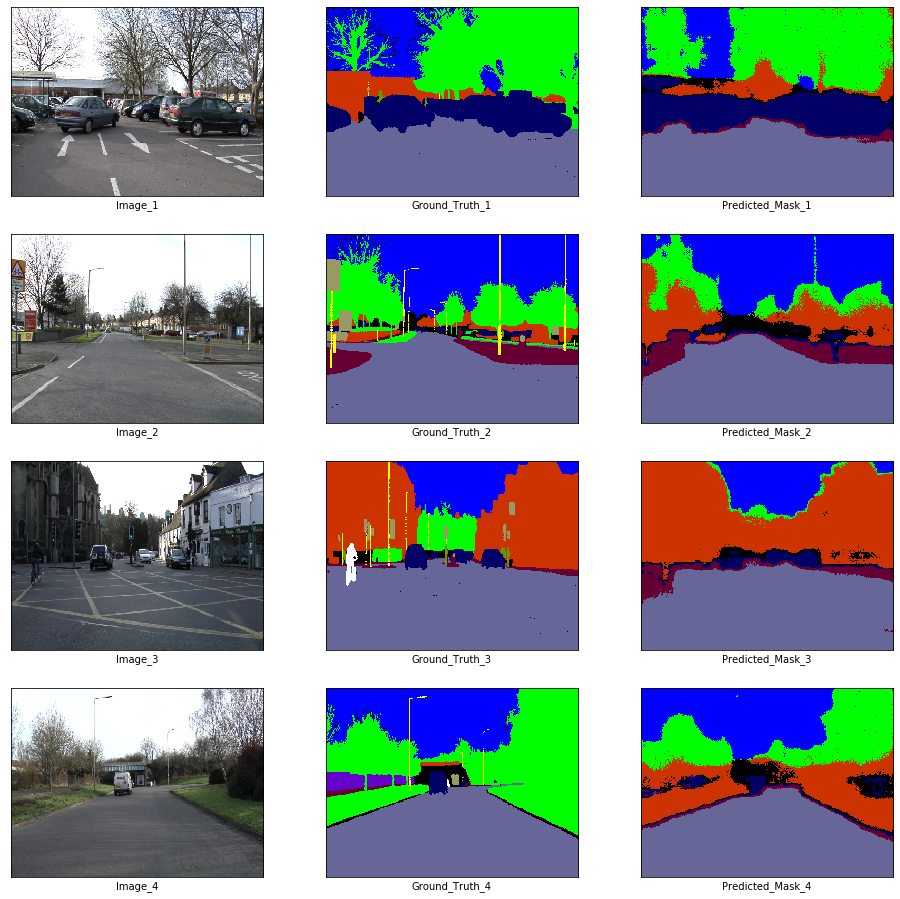

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 11



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.1642421285311382
Training Time: 35.99319052696228 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 2.7642712593078613
Epoch 12



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.1197678860690858
Training Time: 35.2868390083313 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 3.83925461769104
Epoch 13



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.0669083098570507
Training Time: 35.63077259063721 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -12.92186164855957
Epoch 14



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.0365263753467135
Training Time: 34.73810315132141 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.5416693687438965
Epoch 15



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.0237653536929026
Training Time: 34.12343668937683 seconds


100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


Validation Loss: -4.344313621520996


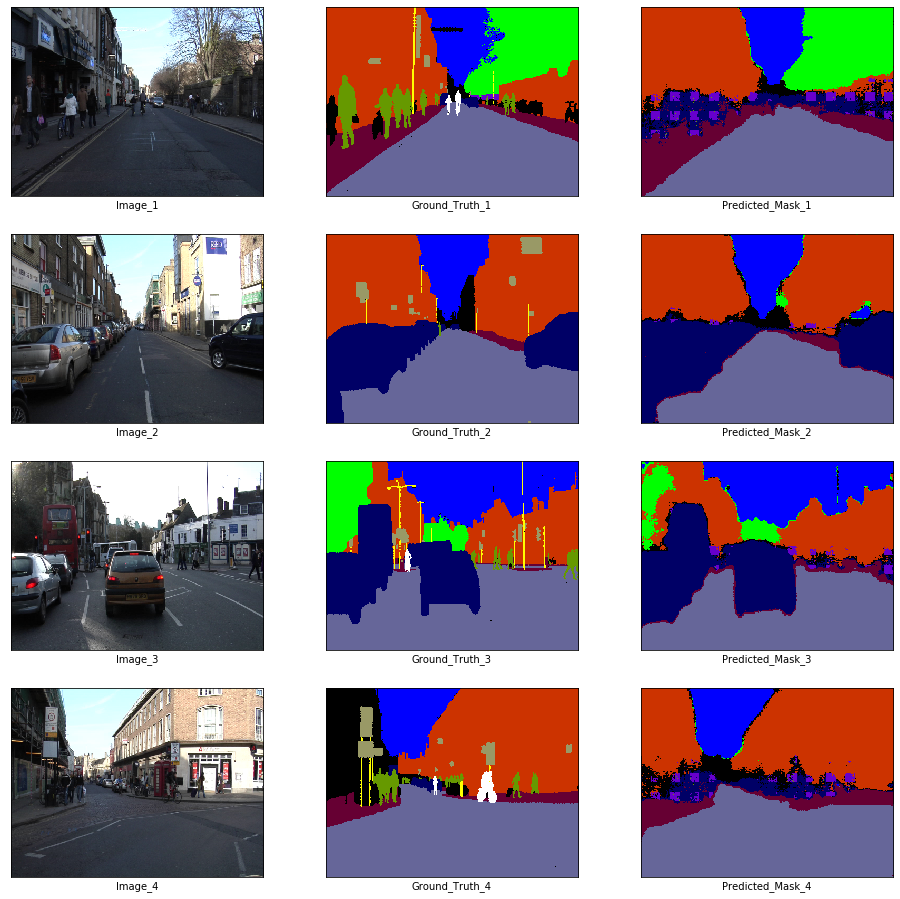

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 16



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.005832478404045
Training Time: 34.45055794715881 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.925382375717163
Epoch 17



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9522587541076872
Training Time: 35.134279012680054 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.5807650089263916
Epoch 18



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.949049691359202
Training Time: 34.32843041419983 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.9246277809143066
Epoch 19



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9290825625260671
Training Time: 34.650322914123535 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.502583026885986
Epoch 20



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9010087466902204
Training Time: 34.38569688796997 seconds


100%|██████████| 10/10 [00:07<00:00,  1.36it/s]


Validation Loss: -6.212695121765137


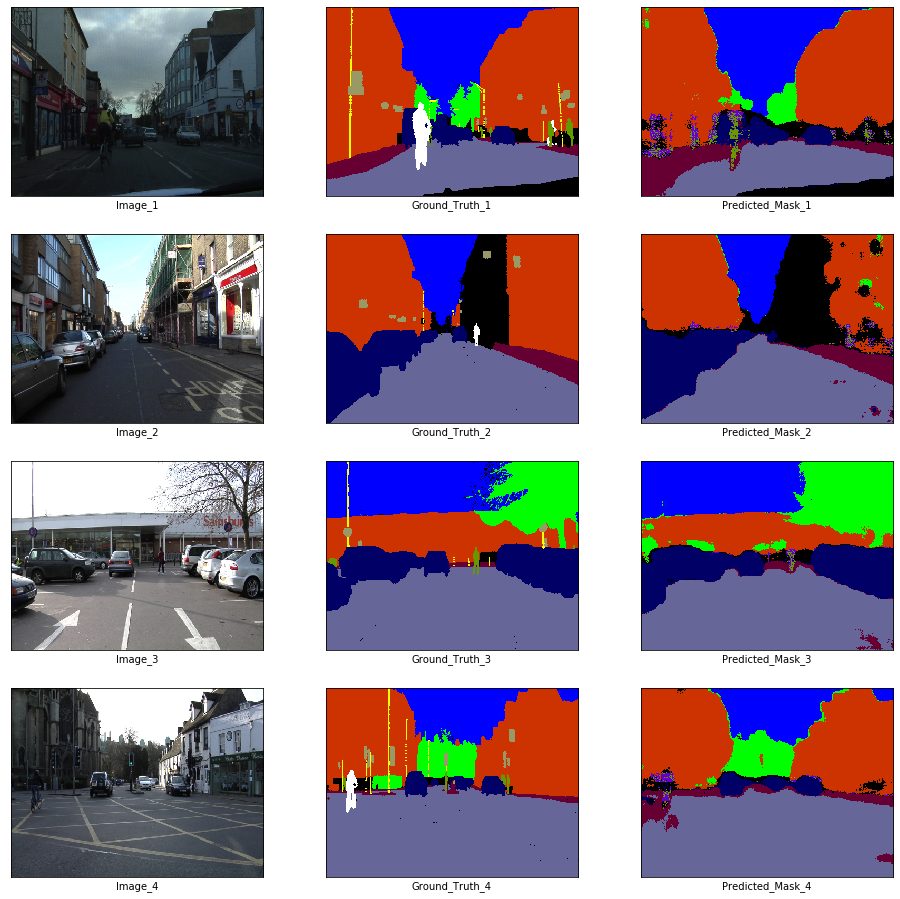

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 21



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8825333714485168
Training Time: 34.726401805877686 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.109793186187744
Epoch 22



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8707981506983439
Training Time: 34.60203742980957 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.707498550415039
Epoch 23



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8629782680008147
Training Time: 34.713858127593994 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.787731409072876
Epoch 24



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8145423067940606
Training Time: 34.14215111732483 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.352169990539551
Epoch 25



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8240066236919827
Training Time: 34.9097945690155 seconds


100%|██████████| 10/10 [00:07<00:00,  1.36it/s]


Validation Loss: -3.1064488887786865


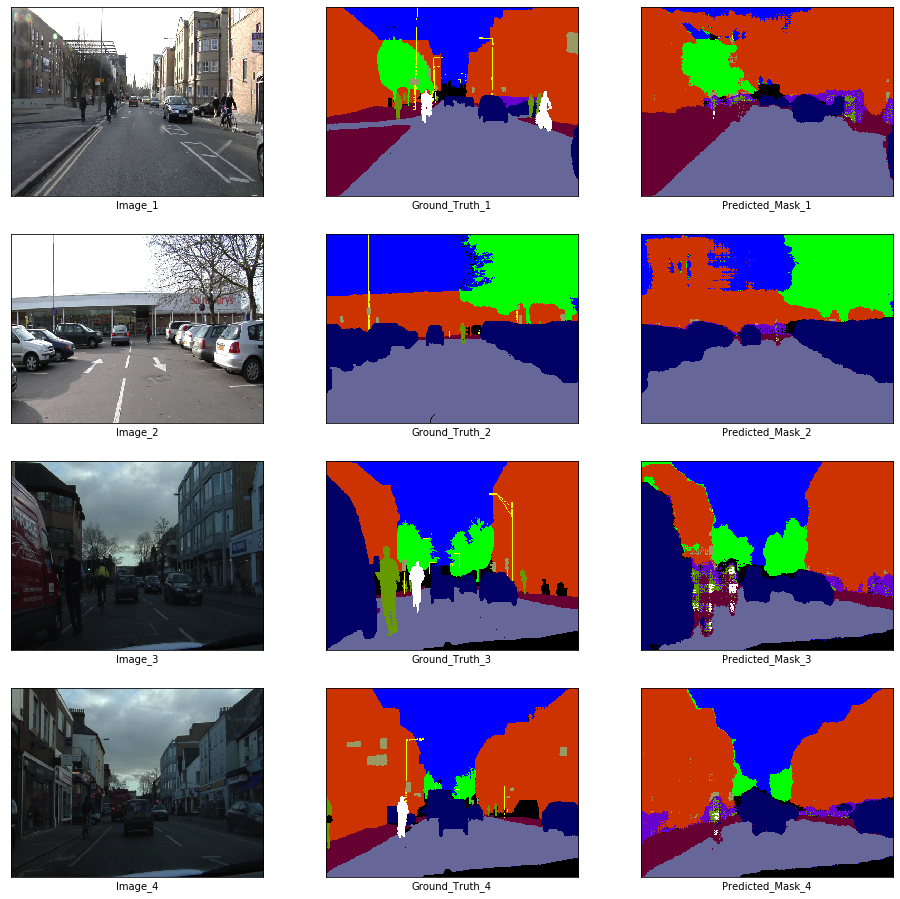

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 26



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7858351700835757
Training Time: 34.563366174697876 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.067936658859253
Epoch 27



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7750780764553282
Training Time: 34.783523082733154 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.2361490726470947
Epoch 28



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7647688703404533
Training Time: 34.506277084350586 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.389359474182129
Epoch 29



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7566219866275787
Training Time: 34.76444339752197 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.8177905082702637
Epoch 30



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7371517535712984
Training Time: 35.037647008895874 seconds


100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


Validation Loss: -2.5890331268310547


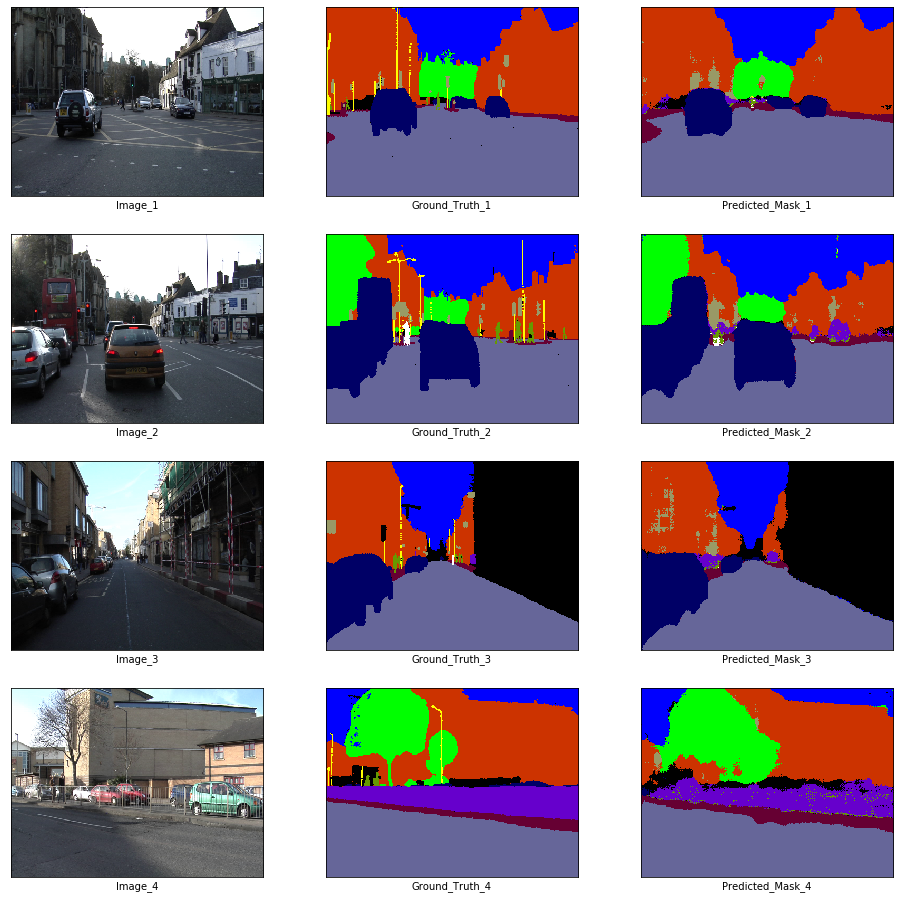

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 31



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7077892621358236
Training Time: 35.129785776138306 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.119533061981201
Epoch 32



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6976940515968535
Training Time: 35.56866502761841 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.194782018661499
Epoch 33



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6967043164703581
Training Time: 36.92918038368225 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.557543992996216
Epoch 34



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6757098535696665
Training Time: 34.82483792304993 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.211295127868652
Epoch 35



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6716082046429316
Training Time: 35.590749740600586 seconds


100%|██████████| 10/10 [00:07<00:00,  1.38it/s]


Validation Loss: -4.093973636627197


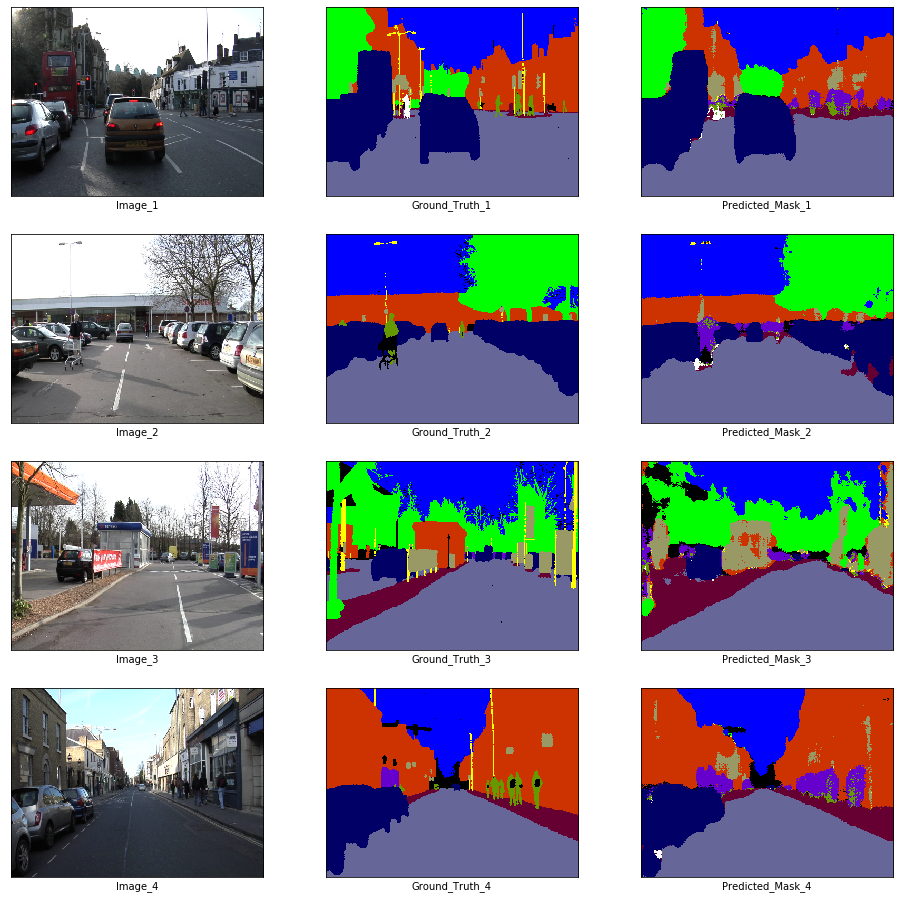

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 36



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6527729978164037
Training Time: 35.45137667655945 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.767409324645996
Epoch 37



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6426952986253632
Training Time: 35.51284861564636 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.787322521209717
Epoch 38



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6216564757956399
Training Time: 35.60844683647156 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.977475643157959
Epoch 39



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6148649652798971
Training Time: 36.03428912162781 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.9689040184021
Epoch 40



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6109240469005373
Training Time: 36.32711958885193 seconds


100%|██████████| 10/10 [00:07<00:00,  1.38it/s]


Validation Loss: -4.60867166519165


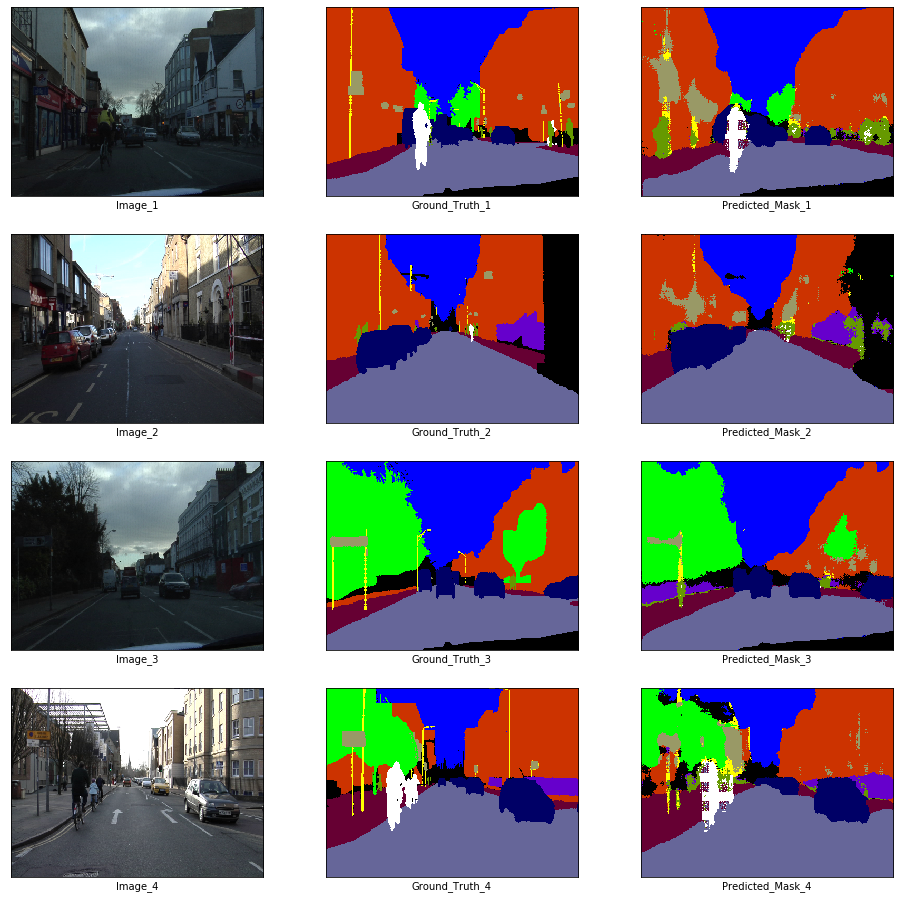

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 41



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6000733408663008
Training Time: 36.87481999397278 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.273191452026367
Epoch 42



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5800364406572448
Training Time: 35.70537090301514 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.205542087554932
Epoch 43



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5813046544790268
Training Time: 35.162445306777954 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.9169504642486572
Epoch 44



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5747254126601749
Training Time: 34.833744049072266 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.5214052200317383
Epoch 45



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5510892478956116
Training Time: 35.30547094345093 seconds


100%|██████████| 10/10 [00:07<00:00,  1.36it/s]


Validation Loss: -4.503111362457275


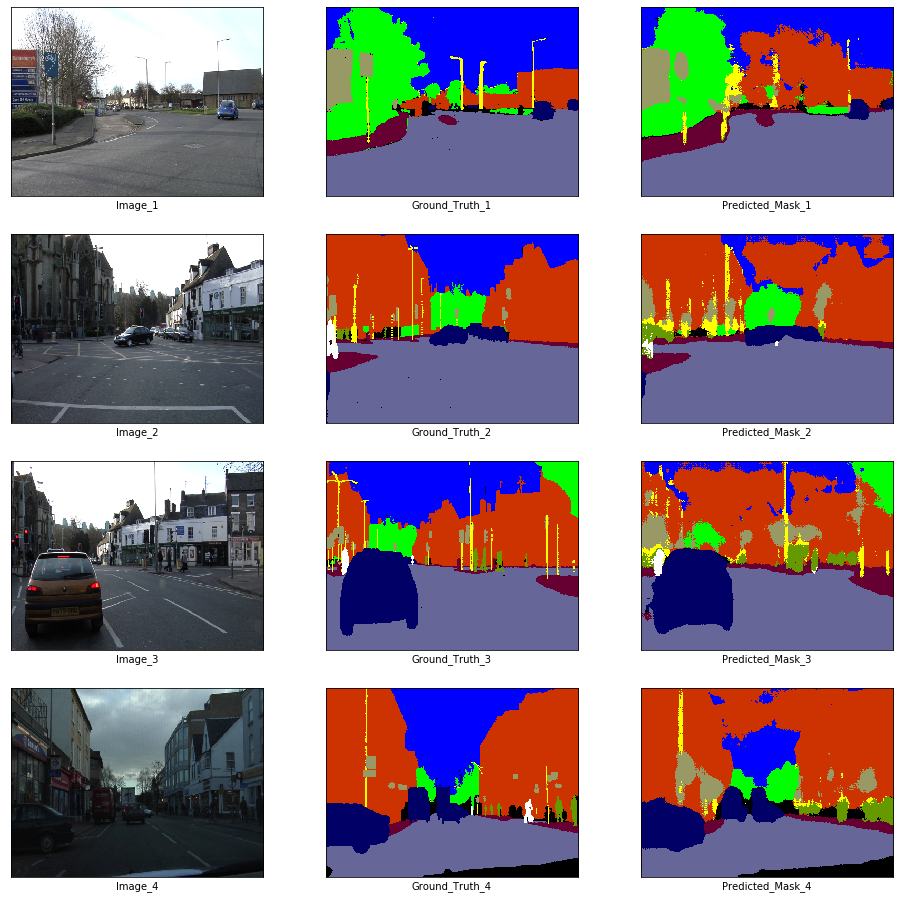

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 46



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5295085037748019
Training Time: 34.79006814956665 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.485269546508789
Epoch 47



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5263189731372727
Training Time: 35.5390043258667 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.5185084342956543
Epoch 48



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.535823261572255
Training Time: 35.647449254989624 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.511059761047363
Epoch 49



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5227665106455485
Training Time: 34.884732723236084 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.384037733078003
Epoch 50



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5111889516313871
Training Time: 36.32857966423035 seconds


100%|██████████| 10/10 [00:07<00:00,  1.32it/s]


Validation Loss: -4.678163528442383


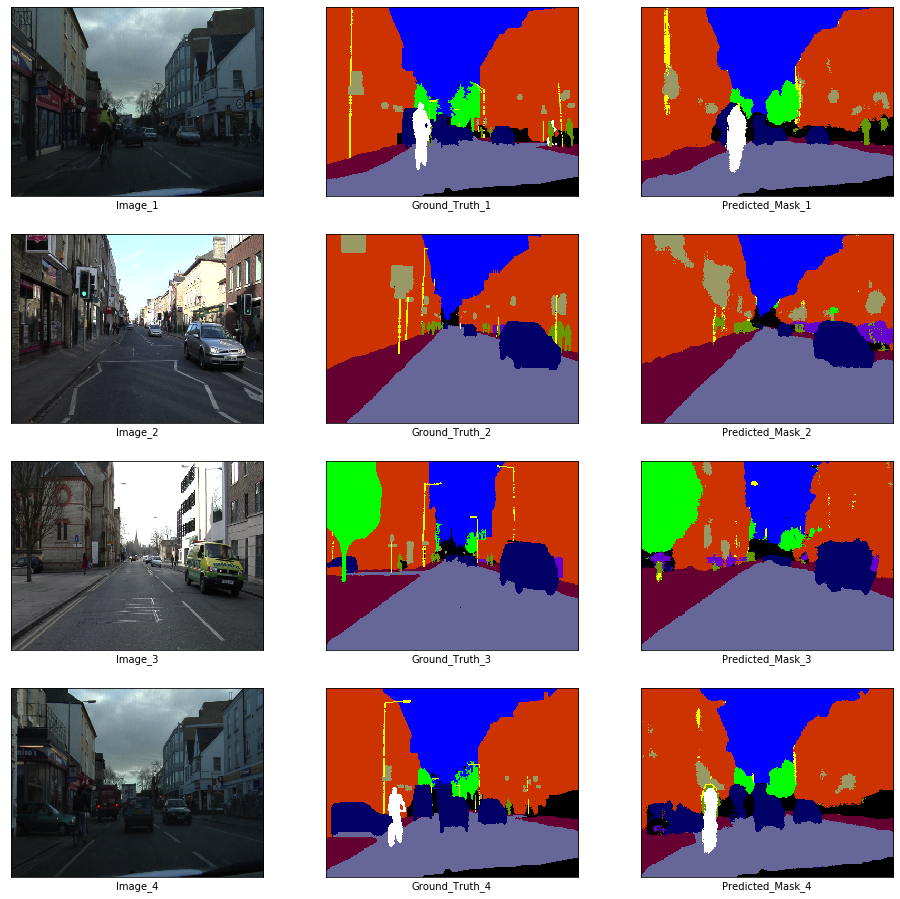

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 51



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5063882395625114
Training Time: 35.73836588859558 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.7846996784210205
Epoch 52



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.47947777559359867
Training Time: 35.36286687850952 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.574636936187744
Epoch 53



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4706092236770524
Training Time: 37.03453254699707 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.287238597869873
Epoch 54



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4679548169175784
Training Time: 36.47965478897095 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.690401792526245
Epoch 55



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.46765774654017556
Training Time: 34.474916219711304 seconds


100%|██████████| 10/10 [00:07<00:00,  1.37it/s]


Validation Loss: -4.41804838180542


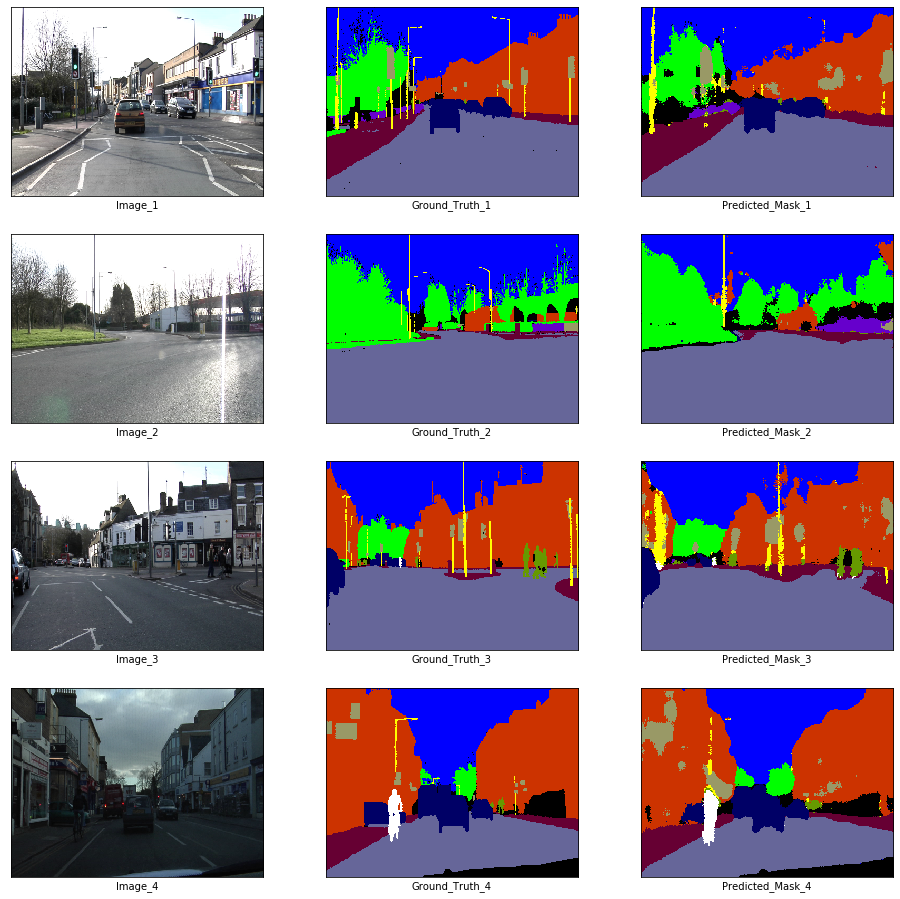

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 56



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4729095639453994
Training Time: 35.14337110519409 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.101107120513916
Epoch 57



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4723792200287183
Training Time: 35.47675824165344 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.038376331329346
Epoch 58



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.45458796785937416
Training Time: 34.41549491882324 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.098705291748047
Epoch 59



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.45495262410905624
Training Time: 35.108097076416016 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.1413187980651855
Epoch 60



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4456173810693953
Training Time: 35.47951936721802 seconds


100%|██████████| 10/10 [00:07<00:00,  1.26it/s]


Validation Loss: -3.7337234020233154


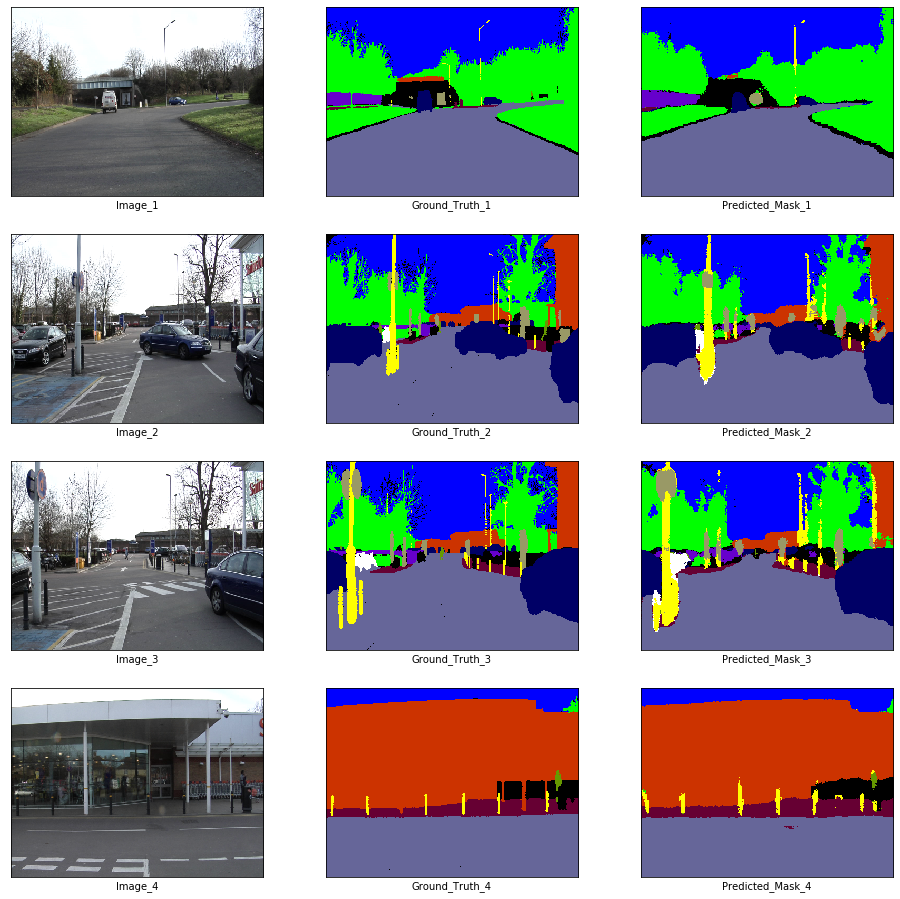

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 61



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4348672893312242
Training Time: 35.79070329666138 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.5657970905303955
Epoch 62



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.40313733534680474
Training Time: 35.43974184989929 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.2853055000305176
Epoch 63



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4195932108494971
Training Time: 34.72497487068176 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.7086362838745117
Epoch 64



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4225976640979449
Training Time: 35.00206971168518 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.92606782913208
Epoch 65



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4070996443430583
Training Time: 34.33458232879639 seconds


100%|██████████| 10/10 [00:07<00:00,  1.32it/s]


Validation Loss: -3.3601737022399902


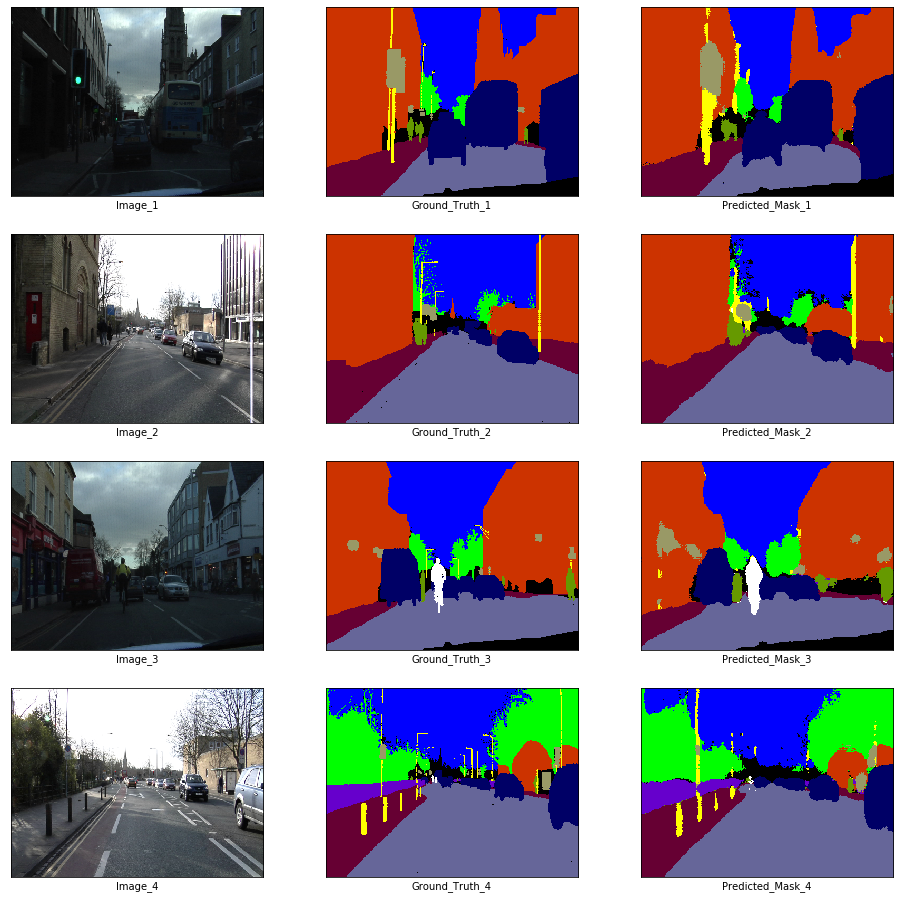

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 66



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4012439176440239
Training Time: 35.12229895591736 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.528285026550293
Epoch 67



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.41552997049358154
Training Time: 35.345638275146484 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.923982620239258
Epoch 68



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4325358014967706
Training Time: 38.35635542869568 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.153740406036377
Epoch 69



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4152597073051665
Training Time: 35.96862053871155 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.723548412322998
Epoch 70



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4002922690576977
Training Time: 35.53604459762573 seconds


100%|██████████| 10/10 [00:07<00:00,  1.38it/s]


Validation Loss: -3.267158031463623


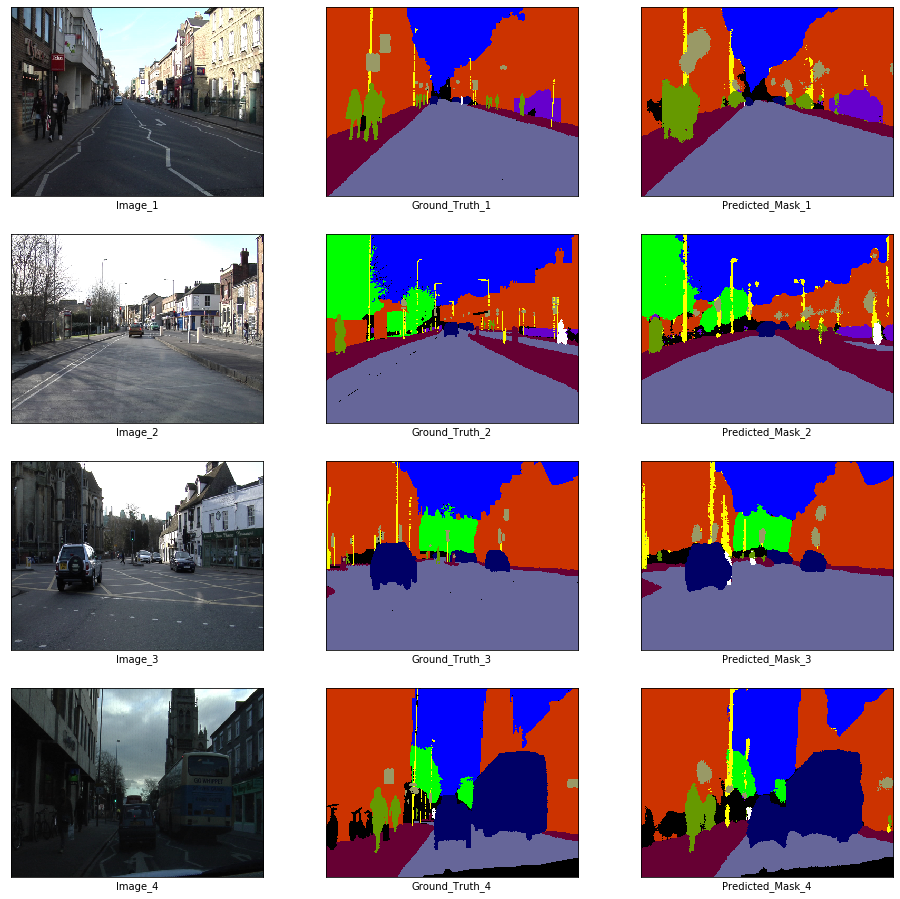

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 71



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.39537136339479023
Training Time: 35.62293863296509 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.6384682655334473
Epoch 72



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3754712790250778
Training Time: 34.60997653007507 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.7949769496917725
Epoch 73



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.38274108866850537
Training Time: 36.47308158874512 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.893192768096924
Epoch 74



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36788761698537403
Training Time: 35.76604175567627 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.239682197570801
Epoch 75



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36787425726652145
Training Time: 35.448070764541626 seconds


100%|██████████| 10/10 [00:08<00:00,  1.24it/s]


Validation Loss: -3.240795612335205


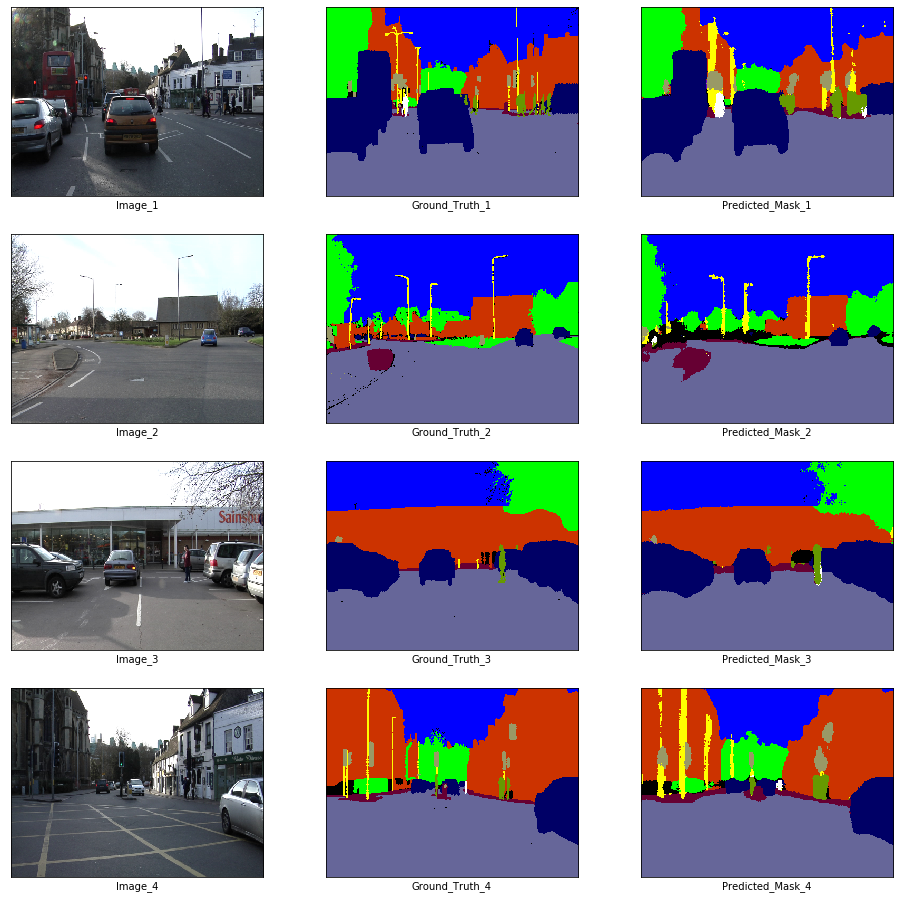

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 76



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36463603377342224
Training Time: 35.55778622627258 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.3477985858917236
Epoch 77



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3663960678709878
Training Time: 36.28572130203247 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.9080636501312256
Epoch 78



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3486237766014205
Training Time: 34.60232734680176 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.5313947200775146
Epoch 79



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3511400611864196
Training Time: 35.330891370773315 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.9267427921295166
Epoch 80



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.353202444811662
Training Time: 35.80364418029785 seconds


100%|██████████| 10/10 [00:07<00:00,  1.32it/s]


Validation Loss: -3.8616585731506348


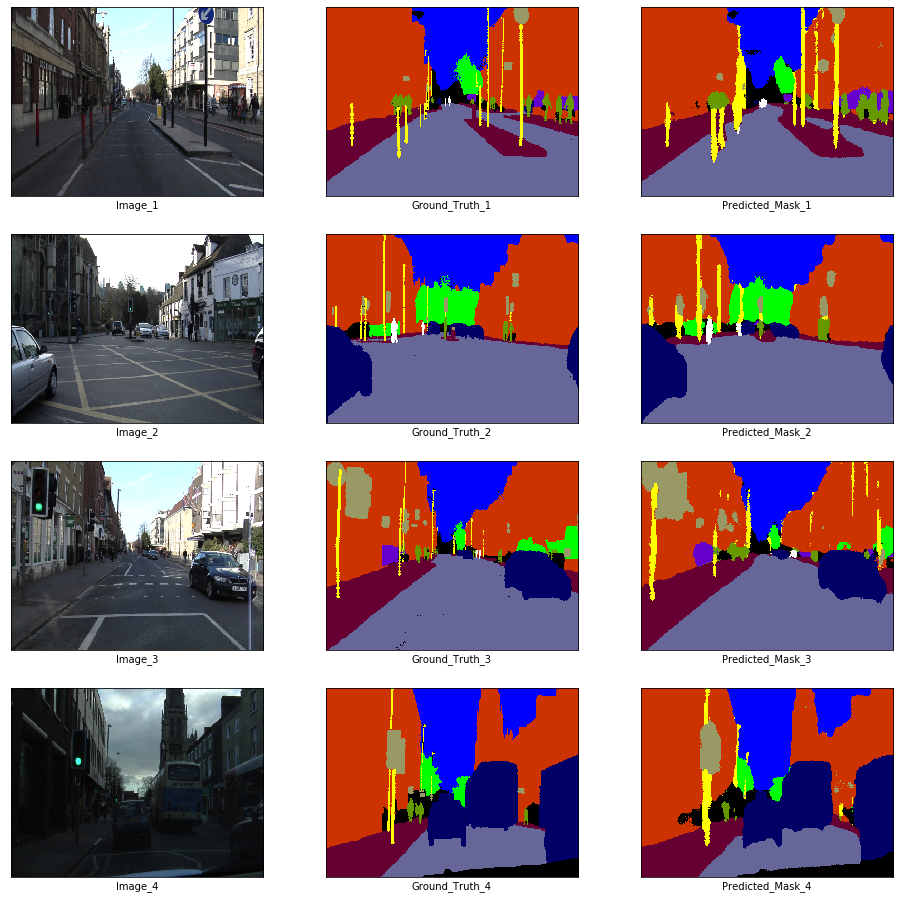

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 81



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.35650695612033206
Training Time: 35.61040472984314 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.736973762512207
Epoch 82



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.35115111867586773
Training Time: 35.69161128997803 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.7752366065979004
Epoch 83



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.35092617405785453
Training Time: 35.10110688209534 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.2270288467407227
Epoch 84



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3397228411502308
Training Time: 35.92752742767334 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.162548065185547
Epoch 85



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.35532352162732017
Training Time: 35.64011549949646 seconds


100%|██████████| 10/10 [00:07<00:00,  1.26it/s]


Validation Loss: -4.74962043762207


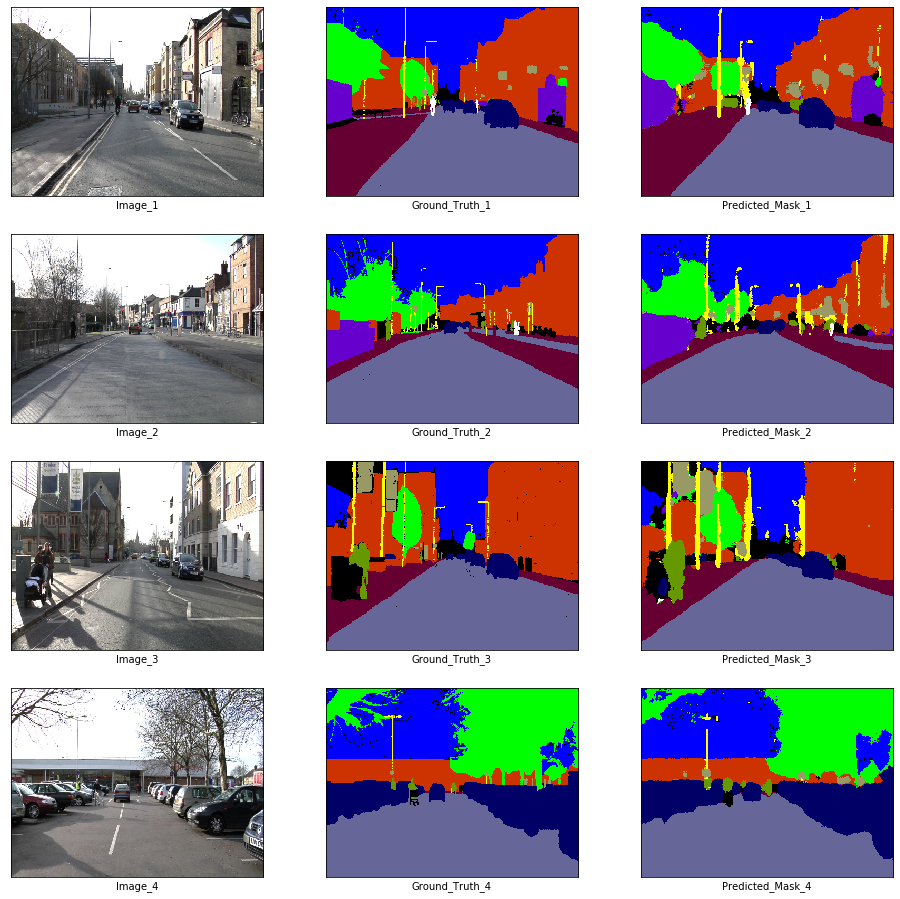

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 86



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3460304844710562
Training Time: 35.444382429122925 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.3574986457824707
Epoch 87



 14%|█▍        | 5/36 [00:04<00:29,  1.06it/s]

In [ ]:
train_loss_history, val_loss_history = train(
    enet, train_loader, val_loader,
    device, criterion, optimizer,
    len(train_images) // batch_size,
    len(val_images) // batch_size, 5,
    5, './checkpoints', 'enet-model', 100
)